In [1]:
from google.colab import files
df=files.upload()

Saving kag_risk_factors_cervical_cancer.csv to kag_risk_factors_cervical_cancer.csv


In [22]:
import pandas as pd
import numpy as np
import missingno as msno
import seaborn as sns
import matplotlib.pyplot as plt


In [3]:
df=pd.read_csv("kag_risk_factors_cervical_cancer.csv")

In [4]:
df.head()

,Age,Number of sexual partners,First sexual intercourse,Num of pregnancies,Smokes,Smokes (years),Smokes (packs/year),Hormonal Contraceptives,Hormonal Contraceptives (years),IUD,...,STDs: Time since first diagnosis,STDs: Time since last diagnosis,Dx:Cancer,Dx:CIN,Dx:HPV,Dx,Hinselmann,Schiller,Citology,Biopsy
0,18,4.0,15.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,?,?,0,0,0,0,0,0,0,0
1,15,1.0,14.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,?,?,0,0,0,0,0,0,0,0
2,34,1.0,?,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,?,?,0,0,0,0,0,0,0,0
3,52,5.0,16.0,4.0,1.0,37.0,37.0,1.0,3.0,0.0,...,?,?,1,0,1,0,0,0,0,0
4,46,3.0,21.0,4.0,0.0,0.0,0.0,1.0,15.0,0.0,...,?,?,0,0,0,0,0,0,0,0


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 858 entries, 0 to 857
Data columns (total 36 columns):
 #   Column                              Non-Null Count  Dtype 
---  ------                              --------------  ----- 
 0   Age                                 858 non-null    int64 
 1   Number of sexual partners           858 non-null    object
 2   First sexual intercourse            858 non-null    object
 3   Num of pregnancies                  858 non-null    object
 4   Smokes                              858 non-null    object
 5   Smokes (years)                      858 non-null    object
 6   Smokes (packs/year)                 858 non-null    object
 7   Hormonal Contraceptives             858 non-null    object
 8   Hormonal Contraceptives (years)     858 non-null    object
 9   IUD                                 858 non-null    object
 10  IUD (years)                         858 non-null    object
 11  STDs                                858 non-null    object

In [6]:
df['Smokes'].value_counts()

0.0    722
1.0    123
?       13
Name: Smokes, dtype: int64

In [7]:
df['Smokes (years)'].value_counts()

0.0            722
1.266972909     15
?               13
5.0              9
9.0              9
1.0              8
3.0              7
2.0              7
16.0             6
7.0              6
8.0              6
11.0             5
10.0             5
4.0              5
15.0             4
14.0             4
6.0              4
13.0             3
0.5              3
19.0             3
12.0             3
22.0             2
32.0             1
20.0             1
28.0             1
24.0             1
18.0             1
34.0             1
37.0             1
21.0             1
0.16             1
Name: Smokes (years), dtype: int64

In [8]:
df['Smokes (packs/year)'].value_counts()

0.0             722
0.5132021277     18
?                13
1.0               6
3.0               5
               ... 
37.0              1
1.25              1
2.25              1
0.003             1
0.3               1
Name: Smokes (packs/year), Length: 63, dtype: int64

In [9]:
df_NaNed = df.replace('?', pd.np.nan)

<ipython-input-9-f7f905b206a1>:1: FutureWarning: The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead.
  df_NaNed = df.replace('?', pd.np.nan)


In [10]:
df_NaNed

,Age,Number of sexual partners,First sexual intercourse,Num of pregnancies,Smokes,Smokes (years),Smokes (packs/year),Hormonal Contraceptives,Hormonal Contraceptives (years),IUD,...,STDs: Time since first diagnosis,STDs: Time since last diagnosis,Dx:Cancer,Dx:CIN,Dx:HPV,Dx,Hinselmann,Schiller,Citology,Biopsy
0,18,4.0,15.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,0,0,0,0,0,0,0,0
1,15,1.0,14.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,0,0,0,0,0,0,0,0
2,34,1.0,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,0,0,0,0,0,0,0,0
3,52,5.0,16.0,4.0,1.0,37.0,37.0,1.0,3.0,0.0,...,NaN,NaN,1,0,1,0,0,0,0,0
4,46,3.0,21.0,4.0,0.0,0.0,0.0,1.0,15.0,0.0,...,NaN,NaN,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
853,34,3.0,18.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,0,0,0,0,0,0,0,0
854,32,2.0,19.0,1.0,0.0,0.0,0.0,1.0,8.0,0.0,...,NaN,NaN,0,0,0,0,0,0,0,0
855,25,2.0,17.0,0.0,0.0,0.0,0.0,1.0,0.08,0.0,...,NaN,NaN,0,0,0,0,0,0,1,0
856,33,2.0,24.0,2.0,0.0,0.0,0.0,1.0,0.08,0.0,...,NaN,NaN,0,0,0,0,0,0,0,0


<Axes: >

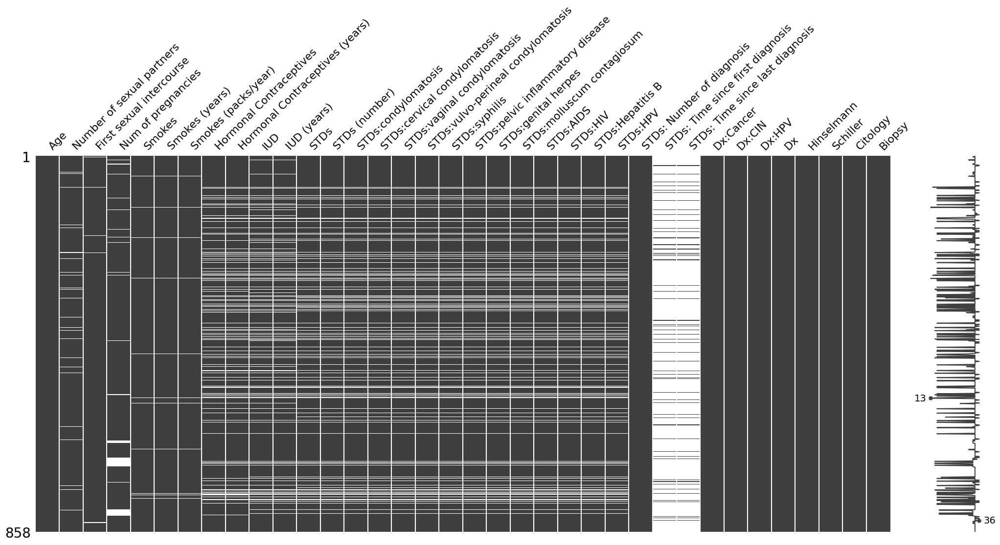

In [12]:
msno.matrix(df_NaNed)

In [13]:
df_NaNed['Number of sexual partners'].astype('float')

0      4.0
1      1.0
2      1.0
3      5.0
4      3.0
      ... 
853    3.0
854    2.0
855    2.0
856    2.0
857    2.0
Name: Number of sexual partners, Length: 858, dtype: float64

In [14]:
df_NaNed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 858 entries, 0 to 857
Data columns (total 36 columns):
 #   Column                              Non-Null Count  Dtype 
---  ------                              --------------  ----- 
 0   Age                                 858 non-null    int64 
 1   Number of sexual partners           832 non-null    object
 2   First sexual intercourse            851 non-null    object
 3   Num of pregnancies                  802 non-null    object
 4   Smokes                              845 non-null    object
 5   Smokes (years)                      845 non-null    object
 6   Smokes (packs/year)                 845 non-null    object
 7   Hormonal Contraceptives             750 non-null    object
 8   Hormonal Contraceptives (years)     750 non-null    object
 9   IUD                                 741 non-null    object
 10  IUD (years)                         741 non-null    object
 11  STDs                                753 non-null    object

In [15]:
df_NaNed = df_NaNed.apply(pd.to_numeric, errors='ignore')

In [16]:
df_NaNed['Number of sexual partners'].min(),df_NaNed['Number of sexual partners'].max()

(1.0, 28.0)

In [17]:
df_NaNed['First sexual intercourse'].min(),df_NaNed['First sexual intercourse'].max()

(10.0, 32.0)

In [19]:
df_NaNed = df_NaNed.drop(columns=['STDs: Time since last diagnosis','STDs: Time since first diagnosis'], axis=1)

In [20]:
df_without_na = df_NaNed.dropna()

In [21]:
df_without_na.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 668 entries, 0 to 857
Data columns (total 34 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Age                                 668 non-null    int64  
 1   Number of sexual partners           668 non-null    float64
 2   First sexual intercourse            668 non-null    float64
 3   Num of pregnancies                  668 non-null    float64
 4   Smokes                              668 non-null    float64
 5   Smokes (years)                      668 non-null    float64
 6   Smokes (packs/year)                 668 non-null    float64
 7   Hormonal Contraceptives             668 non-null    float64
 8   Hormonal Contraceptives (years)     668 non-null    float64
 9   IUD                                 668 non-null    float64
 10  IUD (years)                         668 non-null    float64
 11  STDs                                668 non-n

<Axes: >

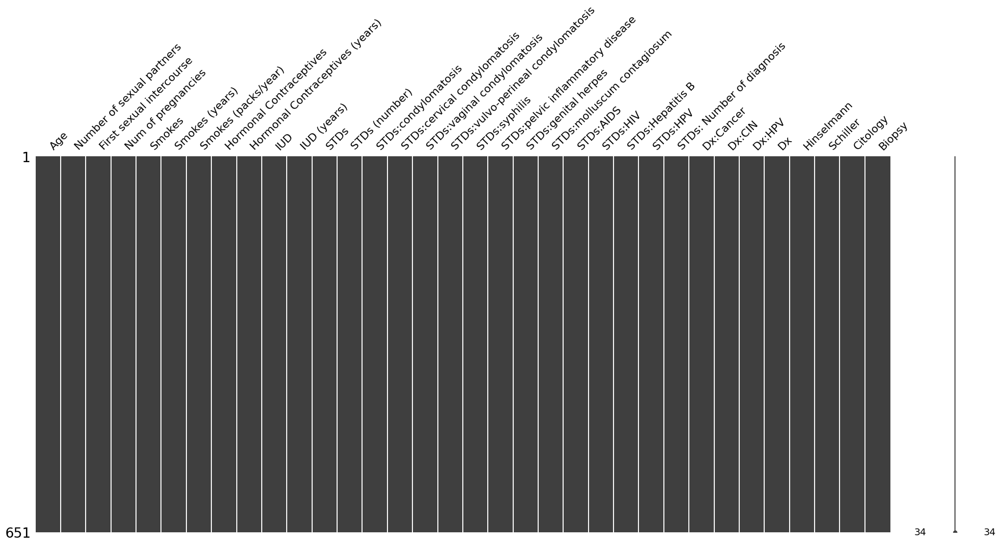

In [50]:
msno.matrix(df_without_na)

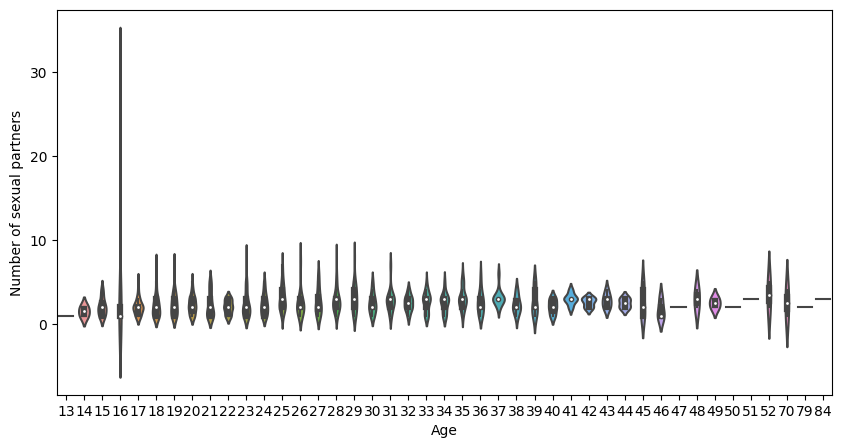

In [24]:
plt.figure(figsize=(10,5))
sns.violinplot(data=df_without_na, x="Age", y='Number of sexual partners')
plt.show()

In [25]:
upper_quantile = df_without_na["Number of sexual partners"].quantile(0.95)
df_without_na = df_without_na[df_without_na["Number of sexual partners"] <= upper_quantile]

<Figure size 1000x700 with 0 Axes>

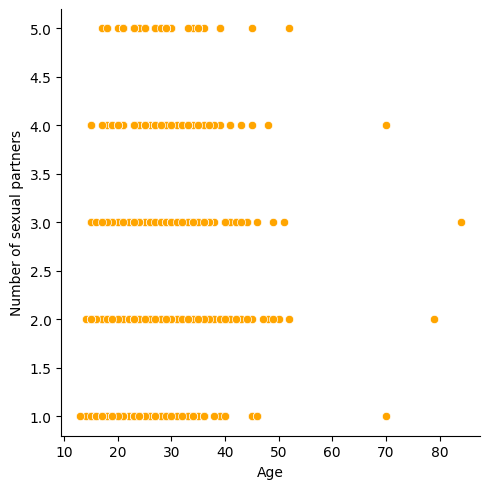

In [49]:
plt.figure(figsize=(10,7))
sns.relplot(data=df_without_na,  x="Age", y='Number of sexual partners',color="Orange")
plt.show()

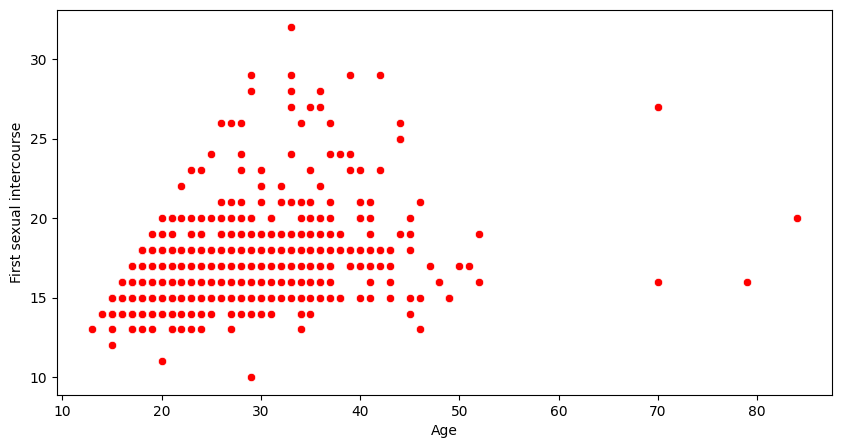

In [38]:
plt.figure(figsize=(10,5))

sns.scatterplot(data=df_without_na, x="Age", y='First sexual intercourse',color="Red")

plt.show()

<Figure size 1000x500 with 0 Axes>

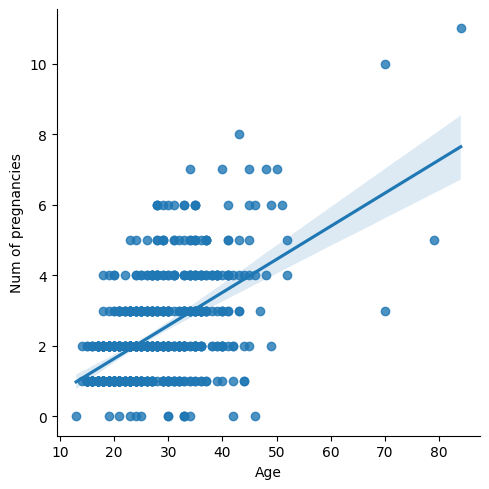

In [70]:
plt.figure(figsize=(10,5))

sns.lmplot(data=df_without_na, x="Age", y='Num of pregnancies')

plt.show()

In [51]:
df_without_na['Num of pregnancies'].min(),df_without_na['Num of pregnancies'].max()

(0.0, 11.0)

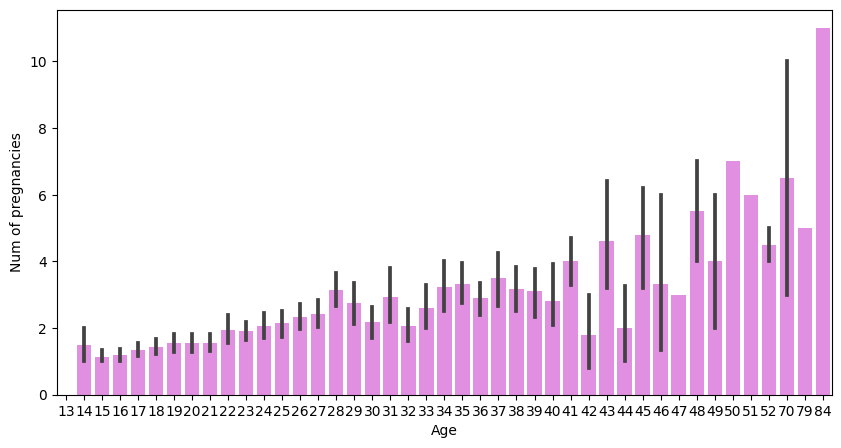

In [56]:
plt.figure(figsize=(10, 5))
sns.barplot(data=df_without_na, x="Age", y='Num of pregnancies',color="Violet")
plt.show()

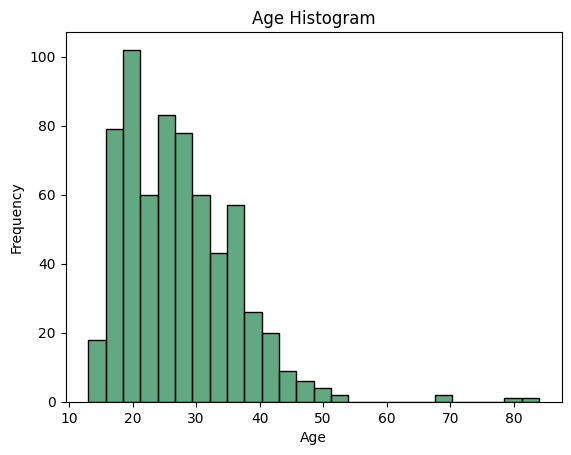

In [57]:
sns.histplot(data=df_without_na, x='Age',color="Seagreen")
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.title('Age Histogram')
plt.show()

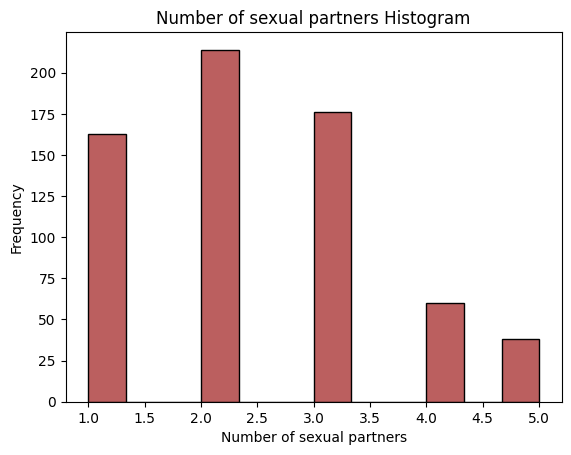

In [61]:
sns.histplot(data=df_without_na, x='Number of sexual partners',color="Brown")
plt.xlabel('Number of sexual partners')
plt.ylabel('Frequency')
plt.title('Number of sexual partners Histogram')
plt.show()

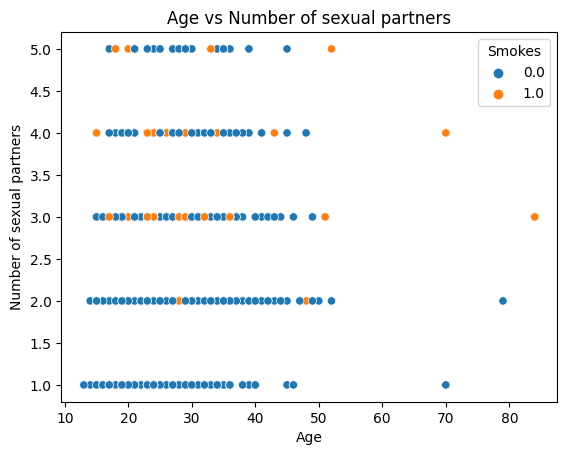

In [64]:
sns.scatterplot(data=df_without_na, x='Age', y='Number of sexual partners', hue='Smokes')
plt.xlabel('Age')
plt.ylabel('Number of sexual partners')
plt.title('Age vs Number of sexual partners')
plt.show()

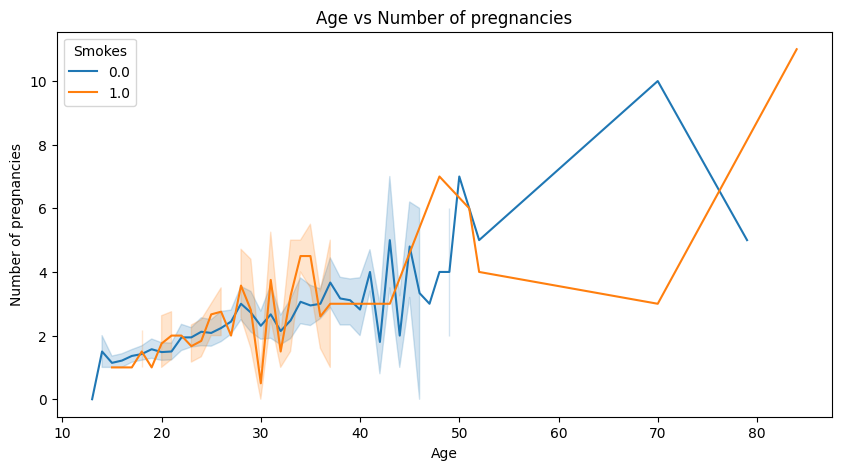

In [66]:
plt.figure(figsize=(10, 5))
sns.lineplot(data=df_without_na, x='Age', y='Num of pregnancies', hue='Smokes')
plt.xlabel('Age')
plt.ylabel('Number of pregnancies')
plt.title('Age vs Number of pregnancies')
plt.show()

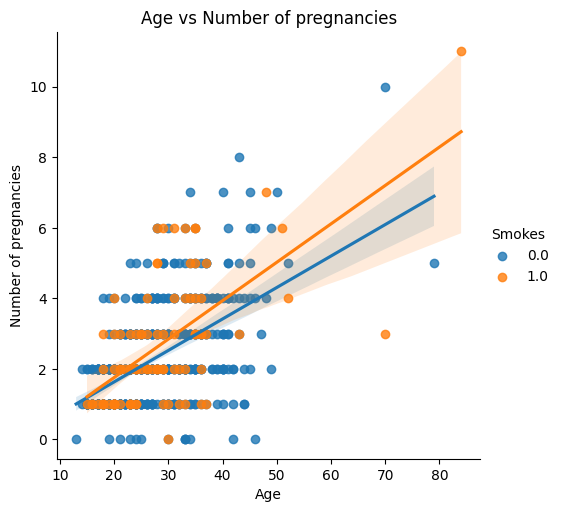

In [67]:
sns.lmplot(data=df_without_na, x='Age', y='Num of pregnancies', hue='Smokes')
plt.xlabel('Age')
plt.ylabel('Number of pregnancies')
plt.title('Age vs Number of pregnancies')
plt.show()

In [68]:
from pandas_profiling import ProfileReport
pp_report = ProfileReport(df_without_na)
pp_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]